In [1]:
import os
import numpy as np
import pylab as pl
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns;sns.set(style="ticks",color_codes=True)

import warnings
warnings.filterwarnings('ignore')
from pandas_profiling import ProfileReport

In [2]:
os.chdir("A:\DATA\Imartics\Python")
df=pd.read_csv("facebook user data.csv")
df.head()

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,2094382,14,19,1999,11,male,266.0,0,0,0,0,0,0,0,0
1,1192601,14,2,1999,11,female,6.0,0,0,0,0,0,0,0,0
2,2083884,14,16,1999,11,male,13.0,0,0,0,0,0,0,0,0
3,1203168,14,25,1999,12,female,93.0,0,0,0,0,0,0,0,0
4,1733186,14,4,1999,12,male,82.0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(99003, 15)

In [4]:
dfp=ProfileReport(df,title="Facebook")
dfp.to_notebook_iframe()

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df.describe()

,userid,age,dob_day,dob_year,dob_month,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
count,9.900300e+04,99003.000000,99003.000000,99003.000000,99003.000000,99001.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000
mean,1.597045e+06,37.280224,14.530408,1975.719776,6.283365,537.887375,196.350787,107.452471,156.078785,142.689363,106.116300,84.120491,49.962425,58.568831
std,3.440592e+05,22.589748,9.015606,22.589748,3.529672,457.649874,387.304229,188.786951,572.280681,1387.919613,445.252985,839.889444,285.560152,601.416348
min,1.000008e+06,13.000000,1.000000,1900.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.298806e+06,20.000000,7.000000,1963.000000,3.000000,226.000000,31.000000,17.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.596148e+06,28.000000,14.000000,1985.000000,6.000000,412.000000,82.000000,46.000000,11.000000,8.000000,4.000000,4.000000,0.000000,2.000000
75%,1.895744e+06,50.000000,22.000000,1993.000000,9.000000,675.000000,206.000000,117.000000,81.000000,59.000000,46.000000,33.000000,7.000000,20.000000
max,2.193542e+06,113.000000,31.000000,2000.000000,12.000000,3139.000000,4923.000000,4144.000000,25111.000000,261197.000000,25111.000000,138561.000000,14865.000000,129953.000000


In [6]:
df.isnull().sum()

userid                     0
age                        0
dob_day                    0
dob_year                   0
dob_month                  0
gender                   175
tenure                     2
friend_count               0
friendships_initiated      0
likes                      0
likes_received             0
mobile_likes               0
mobile_likes_received      0
www_likes                  0
www_likes_received         0
dtype: int64

In [7]:
df.dtypes

userid                     int64
age                        int64
dob_day                    int64
dob_year                   int64
dob_month                  int64
gender                    object
tenure                   float64
friend_count               int64
friendships_initiated      int64
likes                      int64
likes_received             int64
mobile_likes               int64
mobile_likes_received      int64
www_likes                  int64
www_likes_received         int64
dtype: object

In [8]:
def missing_val_imput_cat(dataset,col):
    dataset.loc[dataset[col].isnull(),col]=dataset[col].mode()[0]
    print("missing value for {} done".format(col))
    return

In [9]:
missing_val_imput_cat(df,"gender")

missing value for gender done


###  we use mode for gender Replace missing values because gender is "object type".

Missing values are replaced with the mode value or most frequent value of the entire feature column. When the data is skewed, it is good to consider using mode value for replacing the missing values. 

Note that imputing missing data with mode value can be done with numerical and categorical data

In [10]:
def missing_val_imput(dataset,col):
    dataset.loc[dataset[col].isnull(),col]=dataset[col].median()
    print("missing value for {} done".format(col))
    return
missing_val_imput_cat(df,"tenure")

missing value for tenure done


###  we use median for gender Replace missing values because gender is "Float type"

Missing values are replaced with the median value of the entire feature column. When the data is skewed, it is good to consider using median value for replacing the missing values.Note that imputing missing data with median value can only be done with numerical data

In [11]:
df.isnull().sum()

userid                   0
age                      0
dob_day                  0
dob_year                 0
dob_month                0
gender                   0
tenure                   0
friend_count             0
friendships_initiated    0
likes                    0
likes_received           0
mobile_likes             0
mobile_likes_received    0
www_likes                0
www_likes_received       0
dtype: int64

## Heatmap

The correlation matrix Of the Data set realtionship of the each Column 

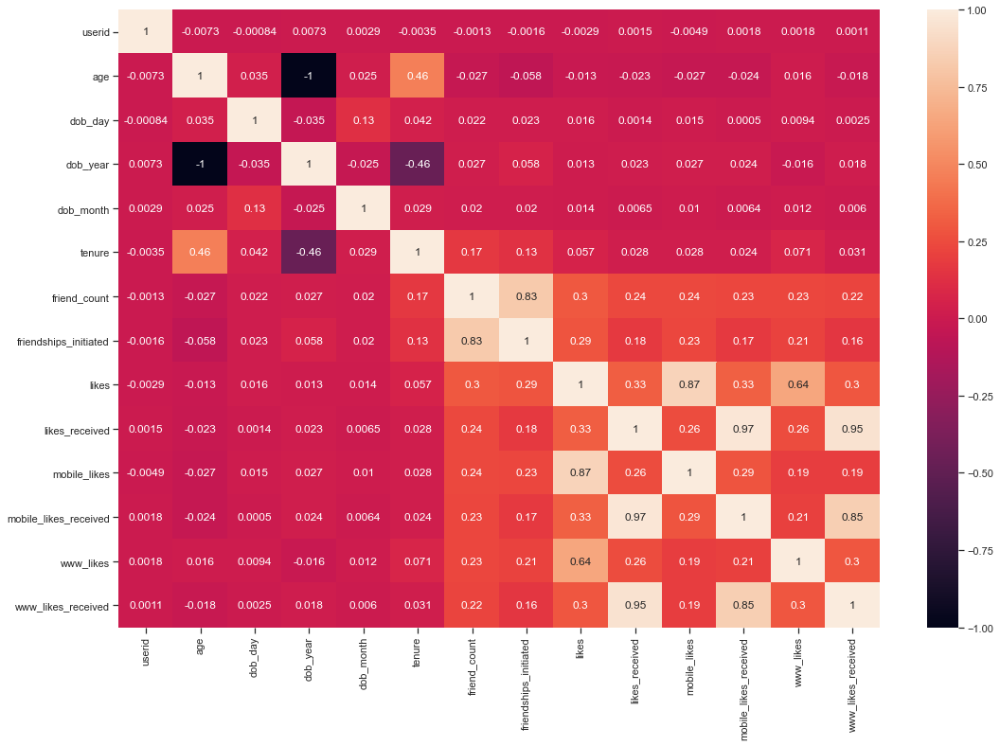

In [12]:
plt.figure(figsize = (18,12))
sns.heatmap(df.corr(),annot=True)

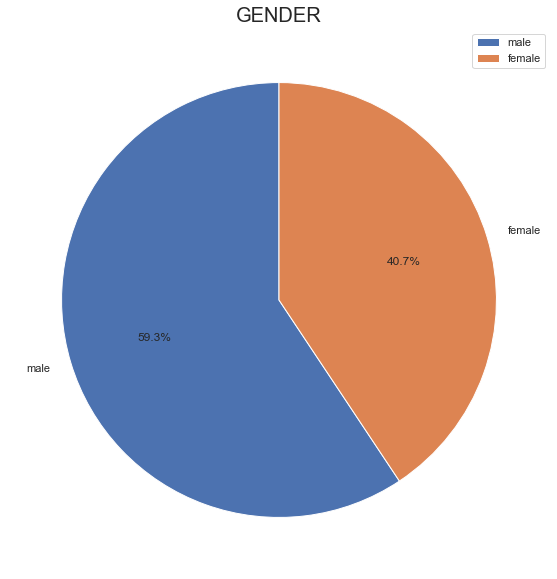

In [13]:
plt.figure(figsize=(10,10))
plt.pie(df['gender'].value_counts(), labels=df['gender'].unique(),autopct='%1.1f%%',startangle=90)
plt.title('GENDER'.upper(),fontsize=20)
plt.legend()
plt.show() 

### Composition of male and female users

This Dataset anaylsis based on Gender the Male are mostly using facebook

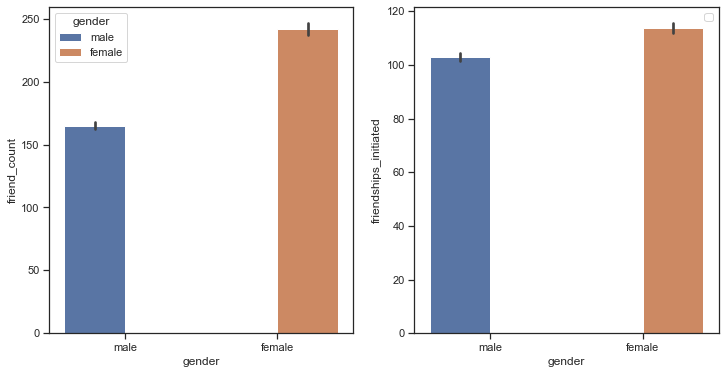

In [14]:
fig, ((ax1, ax2)) = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
sns.barplot(x="gender", y="friend_count",hue='gender',data=df,ax=ax1)
sns.barplot(x="gender", y="friendships_initiated",hue='gender',data=df,ax=ax2)
ax2.legend("")
plt.close(2)
plt.close(3)

### Category of gender has more friends
### Category of gender initiated more friendships

Based on this analysis the Female are the more friends compare the male

Based on this analysis the Female are the more friendships initiated compare the male

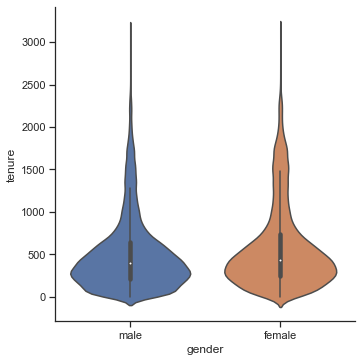

In [15]:
sns.catplot(x=df['gender'],y=df['tenure'],kind="violin", data=df)

### Distribution of tenure across different categories of gender

The Distribution the days since the user has been on FB male more using the female 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 <a list of 20 Text major ticklabel objects>)

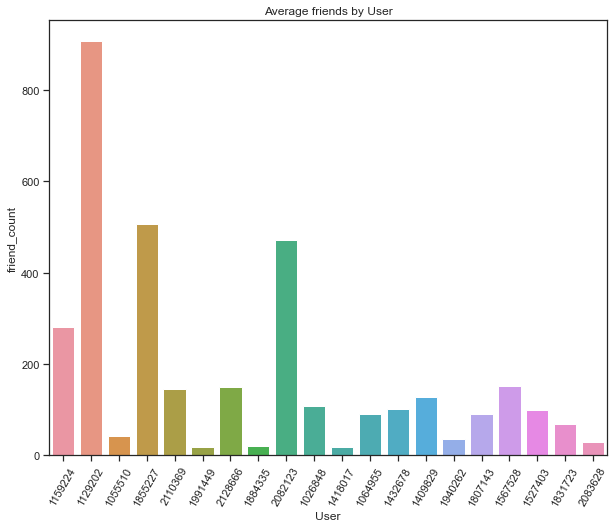

In [16]:
plt.figure(figsize=(10,8))
sns.barplot(x='userid', y='friend_count', estimator=np.mean,data=df,order=df['userid'].value_counts().index.tolist()[0:20])
plt.xlabel('User')
plt.ylabel('friend_count')
plt.title('Average friends by User')
plt.xticks(rotation=60) 

## Analysis based on the least active users on Facebook

### Users have no friends

Using "mean" function from numpy as estimator because User id  has unique values 

This Analysis User has minimum friends

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 <a list of 20 Text major ticklabel objects>)

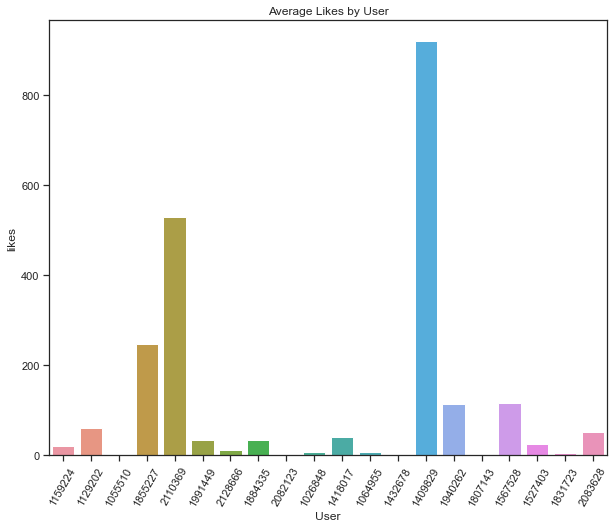

In [17]:
plt.figure(figsize=(10,8))
sns.barplot(x='userid', y='likes', estimator=np.mean,data=df,order=df['userid'].value_counts().index.tolist()[0:20])
plt.xlabel('User')
plt.ylabel('likes')
plt.title('Average Likes by User')
plt.xticks(rotation=60) 

### users did not like any posts

The user id - 2082123,1432678,1807143 has did not like any post

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 <a list of 20 Text major ticklabel objects>)

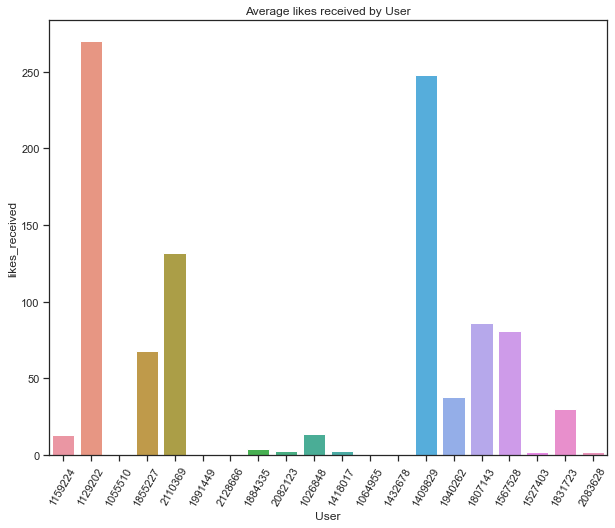

In [18]:
plt.figure(figsize=(10,8))
sns.barplot(x='userid', y='likes_received', estimator=np.mean,data=df,order=df['userid'].value_counts().index.tolist()[0:20])
plt.xlabel('User')
plt.ylabel('likes_received')
plt.title('Average likes received by User')
plt.xticks(rotation=60) 

### Users did not receive any likes

User id -1055510,1991449,2128666,1064955,1432678 has did not receive any likes for them post

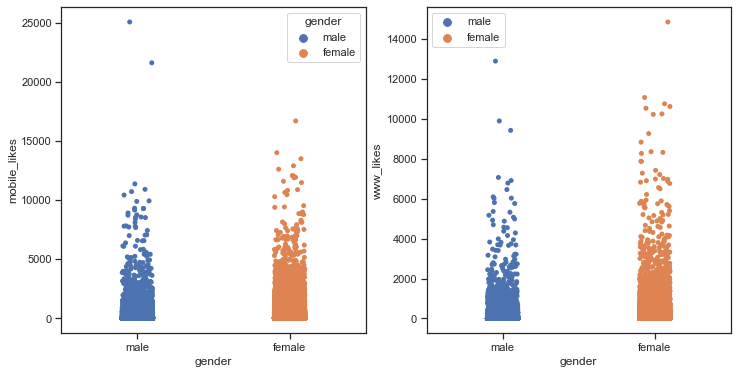

In [19]:
fig, ((ax1, ax2)) = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
sns.stripplot(x="gender", y="mobile_likes",hue='gender',data=df,ax=ax1)
sns.stripplot(x="gender", y="www_likes",hue='gender',data=df,ax=ax2)
ax2.legend()
plt.close(2)
plt.close(3)

## Analysis based on the user accessibility (Mobile Devices vs. Web Devices)

(array([0, 1]), <a list of 2 Text major ticklabel objects>)

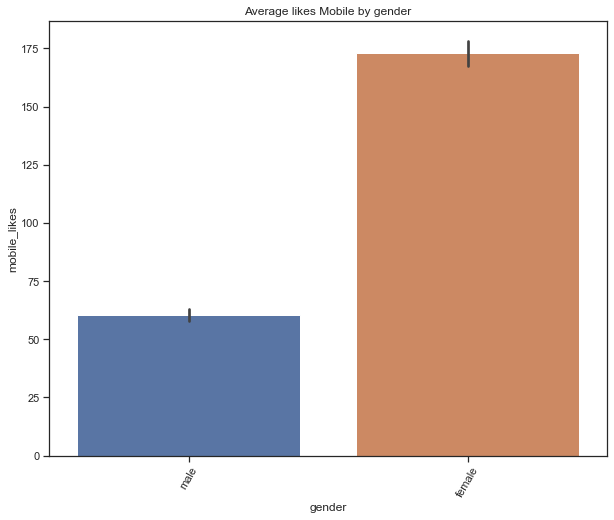

In [20]:
plt.figure(figsize=(10,8))
sns.barplot(x='gender', y='mobile_likes', estimator=np.mean,data=df,order=df['gender'].value_counts().index.tolist()[0:20])
plt.xlabel('gender')
plt.ylabel('mobile_likes')
plt.title('Average likes Mobile by gender')
plt.xticks(rotation=60) 

### Average number of posts liked by users (based on gender) through mobile devices

The Female users are more likes use the mobile devices for using facebook

Text(0.5, 1.0, 'Average likes Web by gender')

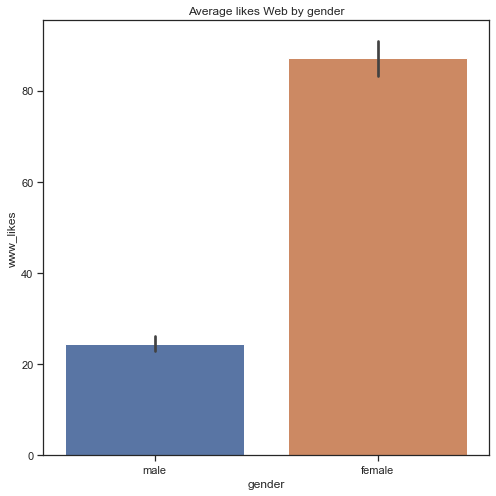

In [21]:
plt.figure(figsize=(8,8))
sns.barplot(x='gender', y='www_likes', estimator=np.mean,data=df,order=df['gender'].value_counts().index.tolist()[0:20])
plt.xlabel('gender')
plt.ylabel('www_likes')
plt.title('Average likes Web by gender')

### Average number of posts liked by users (based on gender) through Web devices

The Female users are more likes use the mobile devices for using facebook

Text(0.5, 1.0, 'Average likes received mobile by gender')

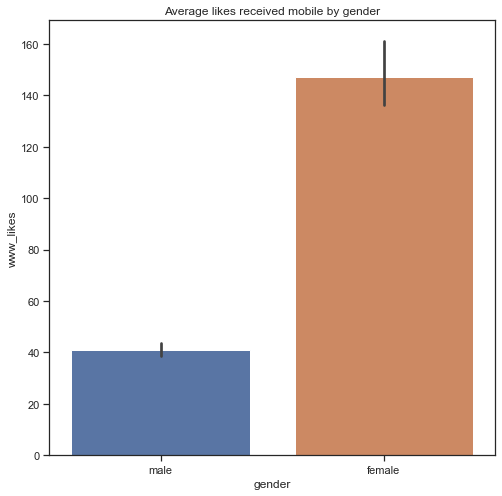

In [22]:
plt.figure(figsize=(8,8))
sns.barplot(x='gender', y='mobile_likes_received', estimator=np.mean,data=df,order=df['gender'].value_counts().index.tolist()[0:20])
plt.xlabel('gender')
plt.ylabel('www_likes')
plt.title('Average likes received mobile by gender')

### Average number of likes received by users (based on gender) through mobile devices

The Female users are received more likes use the mobile devices for using facebook

Text(0.5, 1.0, 'Average likes received Web by gender')

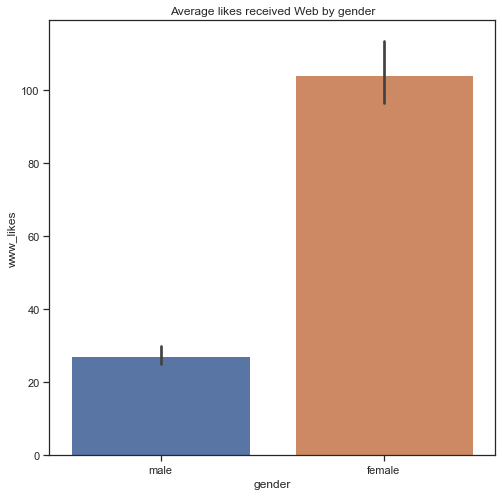

In [23]:
plt.figure(figsize=(8,8))
sns.barplot(x='gender', y='www_likes_received', estimator=np.mean,data=df,order=df['gender'].value_counts().index.tolist()[0:20])
plt.xlabel('gender')
plt.ylabel('www_likes')
plt.title('Average likes received Web by gender')

### Average number of likes received by users (based on gender) through Web devices

The Female users are received more likes use the mobile devices for using facebook